In [3]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

In [4]:
full_dataframe = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv", index_col=0, parse_dates=True)
full_dataframe

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
#,,,,,,,,,,,,,,,,,,,,,
1,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
2,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
3,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
4,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
5,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7039,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7040,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7041,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No


# Table Of Content

In [5]:
# 1. Data Prep
# 2. Data Analysis

# 1. Data Preparation

In [6]:
print("Data type : ", type(full_dataframe))
print("Data dims : ", full_dataframe.shape)
full_dataframe.info()

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (7043, 21)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 1 to 7043
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract      

# Cleaning of Data.

In [7]:
full_dataframe.isnull().sum() # check if null

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [8]:
# remove CID and blanks from total charges
full_dataframe=pd.DataFrame(full_dataframe.drop('customerID', axis = 1))
full_dataframe = full_dataframe[full_dataframe['TotalCharges'] != " "]
full_dataframe.dropna()
full_dataframe.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
#,,,,,,,,,,,,,,,,,,,,
1,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
2,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
3,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
4,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
5,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [9]:
# changing yes no into 1/0
full_dataframe["MultipleLines"].replace("No phone service","No",inplace=True)
full_dataframe["OnlineSecurity"].replace("No internet service","No",inplace=True)
full_dataframe["OnlineBackup"].replace("No internet service","No",inplace=True)
full_dataframe["DeviceProtection"].replace("No internet service","No",inplace=True)
full_dataframe["TechSupport"].replace("No internet service","No",inplace=True)
full_dataframe["StreamingTV"].replace("No internet service","No",inplace=True)
full_dataframe["StreamingMovies"].replace("No internet service","No",inplace=True)

In [10]:
full_dataframe.loc[full_dataframe["OnlineSecurity"] == "No internet service"] # check to see if it's cleaned.

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
#,,,,,,,,,,,,,,,,,,,,


In [11]:
from sklearn.preprocessing import LabelEncoder

In [12]:
pd.get_dummies(full_dataframe, columns=["Partner"]).head()


,gender,SeniorCitizen,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Partner_No,Partner_Yes
#,,,,,,,,,,,,,,,,,,,,,
1,Female,0,No,1,No,No,DSL,No,Yes,No,...,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0,1
2,Male,0,No,34,Yes,No,DSL,Yes,No,Yes,...,No,No,One year,No,Mailed check,56.95,1889.5,No,1,0
3,Male,0,No,2,Yes,No,DSL,Yes,Yes,No,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,0
4,Male,0,No,45,No,No,DSL,Yes,No,Yes,...,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,1,0
5,Female,0,No,2,Yes,No,Fiber optic,No,No,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,0


In [13]:
pd.get_dummies(full_dataframe, columns=["Contract"]).head()


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,StreamingTV,StreamingMovies,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Contract_Month-to-month,Contract_One year,Contract_Two year
#,,,,,,,,,,,,,,,,,,,,,
1,Female,0,Yes,No,1,No,No,DSL,No,Yes,...,No,No,Yes,Electronic check,29.85,29.85,No,1,0,0
2,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,No,No,No,Mailed check,56.95,1889.5,No,0,1,0
3,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,No,Yes,Mailed check,53.85,108.15,Yes,1,0,0
4,Male,0,No,No,45,No,No,DSL,Yes,No,...,No,No,No,Bank transfer (automatic),42.30,1840.75,No,0,1,0
5,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,No,Yes,Electronic check,70.70,151.65,Yes,1,0,0


In [14]:
pd.get_dummies(full_dataframe, columns=["PaymentMethod"]).head()


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,StreamingMovies,Contract,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
#,,,,,,,,,,,,,,,,,,,,,
1,Female,0,Yes,No,1,No,No,DSL,No,Yes,...,No,Month-to-month,Yes,29.85,29.85,No,0,0,1,0
2,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,No,One year,No,56.95,1889.5,No,0,0,0,1
3,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,Month-to-month,Yes,53.85,108.15,Yes,0,0,0,1
4,Male,0,No,No,45,No,No,DSL,Yes,No,...,No,One year,No,42.30,1840.75,No,1,0,0,0
5,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,Month-to-month,Yes,70.70,151.65,Yes,0,0,1,0


In [15]:
from sklearn.preprocessing import LabelEncoder
colslabel =['gender','Partner','Dependents','PhoneService','PaperlessBilling','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaymentMethod','Churn']
full_dataframe[colslabel] = full_dataframe[colslabel].apply(LabelEncoder().fit_transform)
print(full_dataframe)

      gender  SeniorCitizen  Partner  Dependents  tenure  PhoneService  \
#                                                                        
1          0              0        1           0       1             0   
2          1              0        0           0      34             1   
3          1              0        0           0       2             1   
4          1              0        0           0      45             0   
5          0              0        0           0       2             1   
...      ...            ...      ...         ...     ...           ...   
7039       1              0        1           1      24             1   
7040       0              0        1           1      72             1   
7041       0              0        1           1      11             0   
7042       1              1        1           0       4             1   
7043       1              0        0           0      66             1   

      MultipleLines  InternetService 

In [16]:
pd.to_numeric(full_dataframe["tenure"])
full_dataframe['numcattenure']= full_dataframe['tenure']
full_dataframe['cattenure']=full_dataframe['tenure']
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 0)&(full_dataframe['tenure'] < 10)] = "A"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 10)&(full_dataframe['tenure'] < 20)] = "B"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 20)&(full_dataframe['tenure'] < 30)] = "C"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 30)&(full_dataframe['tenure'] < 40)] = "D"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 40)&(full_dataframe['tenure'] < 50)] = "E"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 50)&(full_dataframe['tenure'] < 60)] = "F"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 60)&(full_dataframe['tenure'] < 70)] = "G"
full_dataframe['cattenure'].loc[(full_dataframe['tenure'] >= 70)] = "H"

full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "A")]=0
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "B")]=1
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "C")]=2
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "D")]=3
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "E")]=4
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "F")]=5
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "G")]=6
full_dataframe['numcattenure'].loc[(full_dataframe['cattenure'] == "H")]=7
full_dataframe=pd.DataFrame(full_dataframe.drop('cattenure', axis = 1))
types = full_dataframe.dtypes
print(types)
full_dataframe.head()

gender                int64
SeniorCitizen         int64
Partner               int64
Dependents            int64
tenure                int64
PhoneService          int64
MultipleLines         int64
InternetService       int64
OnlineSecurity        int64
OnlineBackup          int64
DeviceProtection      int64
TechSupport           int64
StreamingTV           int64
StreamingMovies       int64
Contract              int64
PaperlessBilling      int64
PaymentMethod         int64
MonthlyCharges      float64
TotalCharges         object
Churn                 int64
numcattenure          int64
dtype: object


/Users/nicholaswong/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
1,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,1,2,29.85,29.85,0,0
2,1,0,0,0,34,1,0,0,1,0,...,0,0,0,1,0,3,56.95,1889.5,0,3
3,1,0,0,0,2,1,0,0,1,1,...,0,0,0,0,1,3,53.85,108.15,1,0
4,1,0,0,0,45,0,0,0,1,0,...,1,0,0,1,0,0,42.30,1840.75,0,4
5,0,0,0,0,2,1,0,1,0,0,...,0,0,0,0,1,2,70.70,151.65,1,0


# Removing outliers

Q1 = Data.quantile(0.25)
Q3 = Data.quantile(0.75)
IQR = Q3 - Q1

Data_clean= Data[~((Data < (Q1 - 1.5 * IQR)) |(Data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [17]:
full_dataframe['TotalCharges'] = pd.to_numeric(full_dataframe.TotalCharges, errors='coerce') # convert TotalCharges from object to Float.

In [18]:
Data = pd.DataFrame(full_dataframe, columns=['TotalCharges'])
TotalCharges =  pd.DataFrame(full_dataframe['TotalCharges'])
Data.head()

,TotalCharges
#,
1,29.85
2,1889.50
3,108.15
4,1840.75
5,151.65


In [19]:
TotalCharges.describe()

,TotalCharges
count,7032.000000
mean,2283.300441
std,2266.771362
min,18.800000
25%,401.450000
50%,1397.475000
75%,3794.737500
max,8684.800000


<AxesSubplot:>

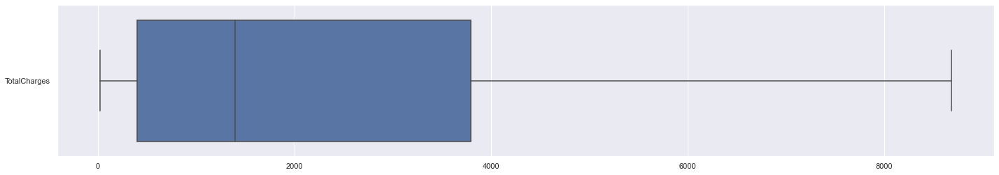

In [20]:
f = plt.figure(figsize=(24,4))
sb.boxplot(data=TotalCharges,orient = "h")

In [21]:
print("Data type : ", type(full_dataframe))
print("Data dims : ", full_dataframe.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (7032, 21)


In [22]:
# Extract only the numeric data variables
numeric_q1_data = pd.DataFrame(full_dataframe[['TotalCharges']])

# Summary Statistics for all Variables
numeric_q1_data.describe().round(2)

,TotalCharges
count,7032.00
mean,2283.30
std,2266.77
min,18.80
25%,401.45
50%,1397.48
75%,3794.74
max,8684.80


In [23]:
Q1 = Data.quantile(0.25)
Q3 = Data.quantile(0.75)
IQR = Q3 - Q1
Data < (Q1 - 1.5 * IQR)
Data > (Q3 + 1.5 * IQR)

Data_clean= Data[~((Data < (Q1 - 1.5 * IQR)) |(Data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [24]:
print("Data type : ", type(Data_clean))
print("Data dims : ", Data_clean.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (7032, 1)


MonthlyCharges

In [25]:
Data = pd.DataFrame(full_dataframe, columns=['MonthlyCharges'])
MonthlyCharges =  pd.DataFrame(full_dataframe['MonthlyCharges'])
Data.head()

,MonthlyCharges
#,
1,29.85
2,56.95
3,53.85
4,42.30
5,70.70


<AxesSubplot:>

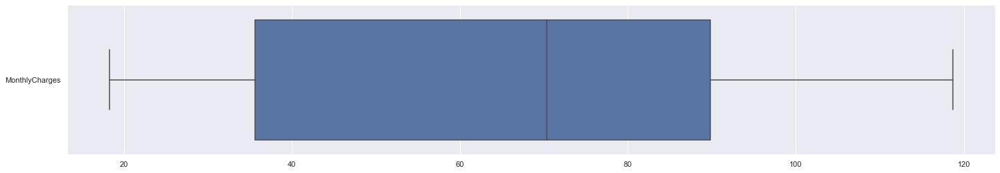

In [26]:
f = plt.figure(figsize=(24,4))
sb.boxplot(data=MonthlyCharges,orient = "h")

In [27]:
print("Data type : ", type(full_dataframe))
print("Data dims : ", full_dataframe.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (7032, 21)


In [28]:
# Extract only the numeric data variables
numeric_q1_data = pd.DataFrame(full_dataframe[['MonthlyCharges']])

# Summary Statistics for all Variables
numeric_q1_data.describe().round(2)

,MonthlyCharges
count,7032.00
mean,64.80
std,30.09
min,18.25
25%,35.59
50%,70.35
75%,89.86
max,118.75


In [29]:
Q1 = Data.quantile(0.25)
Q3 = Data.quantile(0.75)
IQR = Q3 - Q1
Data < (Q1 - 1.5 * IQR)
Data > (Q3 + 1.5 * IQR)

Data_clean= Data[~((Data < (Q1 - 1.5 * IQR)) |(Data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [30]:
print("Data type : ", type(Data_clean))
print("Data dims : ", Data_clean.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (7032, 1)


Tenure

In [31]:
Data = pd.DataFrame(full_dataframe, columns=['tenure'])
tenure =  pd.DataFrame(full_dataframe['tenure'])
Data.head()

,tenure
#,
1,1
2,34
3,2
4,45
5,2


<AxesSubplot:>

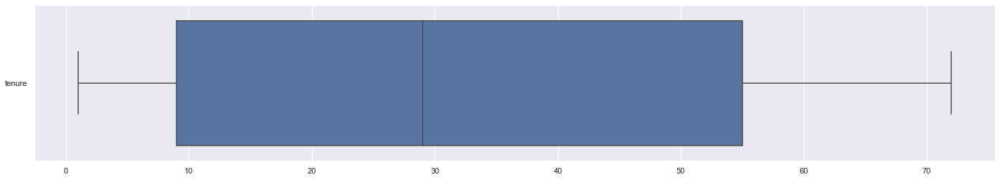

In [32]:
f = plt.figure(figsize=(24,4))
sb.boxplot(data=tenure,orient = "h")

In [37]:
full_dataframe

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
1,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,1,2,29.85,29.85,0,0
2,1,0,0,0,34,1,0,0,1,0,...,0,0,0,1,0,3,56.95,1889.50,0,3
3,1,0,0,0,2,1,0,0,1,1,...,0,0,0,0,1,3,53.85,108.15,1,0
4,1,0,0,0,45,0,0,0,1,0,...,1,0,0,1,0,0,42.30,1840.75,0,4
5,0,0,0,0,2,1,0,1,0,0,...,0,0,0,0,1,2,70.70,151.65,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7039,1,0,1,1,24,1,1,0,1,0,...,1,1,1,1,1,3,84.80,1990.50,0,2
7040,0,0,1,1,72,1,1,1,0,1,...,0,1,1,1,1,1,103.20,7362.90,0,7
7041,0,0,1,1,11,0,0,0,1,0,...,0,0,0,0,1,2,29.60,346.45,0,1


In [102]:
full_dataframe

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
1,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,1,2,29.85,29.85,0,0
2,1,0,0,0,34,1,0,0,1,0,...,0,0,0,1,0,3,56.95,1889.50,0,3
3,1,0,0,0,2,1,0,0,1,1,...,0,0,0,0,1,3,53.85,108.15,1,0
4,1,0,0,0,45,0,0,0,1,0,...,1,0,0,1,0,0,42.30,1840.75,0,4
5,0,0,0,0,2,1,0,1,0,0,...,0,0,0,0,1,2,70.70,151.65,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7039,1,0,1,1,24,1,1,0,1,0,...,1,1,1,1,1,3,84.80,1990.50,0,2
7040,0,0,1,1,72,1,1,1,0,1,...,0,1,1,1,1,1,103.20,7362.90,0,7
7041,0,0,1,1,11,0,0,0,1,0,...,0,0,0,0,1,2,29.60,346.45,0,1


In [99]:
full_dataframe['gender'].unique()

array([0, 1])

In [100]:
full_dataframe['SeniorCitizen'].unique()

array([0, 1])

In [101]:
full_dataframe['Partner'].unique()

array([1, 0])

In [103]:
full_dataframe['Dependents'].unique()

array([0, 1])

In [104]:
full_dataframe['tenure'].unique()

array([ 1, 34,  2, 45,  8, 22, 10, 28, 62, 13, 16, 58, 49, 25, 69, 52, 71,
       21, 12, 30, 47, 72, 17, 27,  5, 46, 11, 70, 63, 43, 15, 60, 18, 66,
        9,  3, 31, 50, 64, 56,  7, 42, 35, 48, 29, 65, 38, 68, 32, 55, 37,
       36, 41,  6,  4, 33, 67, 23, 57, 61, 14, 20, 53, 40, 59, 24, 44, 19,
       54, 51, 26, 39])

In [105]:
full_dataframe['PhoneService'].unique()

array([0, 1])

In [106]:
full_dataframe['MultipleLines'].unique()

array([0, 1])

In [107]:
full_dataframe['InternetService'].unique()

array([0, 1, 2])

In [108]:
full_dataframe['OnlineSecurity'].unique()

array([0, 1])

In [109]:
full_dataframe['OnlineBackup'].unique()

array([1, 0])

In [111]:
full_dataframe['TechSupport'].unique()

array([0, 1])

In [112]:
full_dataframe['StreamingTV'].unique()

array([0, 1])

In [113]:
full_dataframe['StreamingMovies'].unique()

array([0, 1])

In [114]:
full_dataframe['Contract'].unique()

array([0, 1, 2])

In [115]:
full_dataframe['PaperlessBilling'].unique()

array([1, 0])

In [116]:
full_dataframe['PaymentMethod'].unique()

array([2, 3, 0, 1])

In [117]:
full_dataframe['MonthlyCharges'].unique()

array([29.85, 56.95, 53.85, ..., 63.1 , 44.2 , 78.7 ])

In [118]:
full_dataframe['TotalCharges'].unique()

array([  29.85, 1889.5 ,  108.15, ...,  346.45,  306.6 , 6844.5 ])

In [119]:
full_dataframe['Churn'].unique()

array([0, 1])

In [120]:
full_dataframe['numcattenure'].unique()

array([0, 3, 4, 2, 1, 6, 5, 7])

# Split of data

80:20

In [38]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(full_dataframe, test_size=0.2)

In [39]:
train

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
893,1,1,0,0,32,1,1,1,0,0,...,0,0,0,0,1,1,81.10,2619.25,0,3
2285,1,0,0,1,3,1,0,0,1,0,...,0,0,0,0,0,3,55.90,157.55,0,0
2499,1,0,1,0,27,1,0,0,0,1,...,1,0,0,0,1,2,53.80,1389.85,0,2
4198,0,0,0,1,22,1,1,1,0,0,...,0,0,1,0,1,2,84.75,1816.75,0,2
4424,1,0,0,0,33,1,0,0,0,1,...,0,1,0,0,1,1,66.40,2245.40,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5039,0,0,0,0,10,1,0,2,0,0,...,0,0,0,1,1,3,19.30,185.20,0,1
6032,0,1,1,1,12,0,0,0,0,0,...,1,0,0,0,1,3,29.30,355.90,0,1
4312,0,0,0,0,7,0,0,0,0,1,...,0,0,1,0,1,1,40.10,293.30,1,0


In [40]:
test

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
3301,0,0,1,1,33,1,0,2,0,0,...,0,0,0,1,0,3,20.10,579.40,0,3
1931,1,0,0,0,3,1,0,2,0,0,...,0,0,0,0,1,2,20.50,76.95,0,0
4720,1,0,0,0,36,1,1,1,0,0,...,0,0,1,0,1,2,84.90,3067.20,1,3
690,1,0,0,0,51,1,1,1,0,0,...,0,0,1,0,0,0,83.40,4149.45,0,5
3231,1,0,1,1,63,1,0,2,0,0,...,0,0,0,2,0,3,19.55,1245.60,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3684,1,0,1,0,71,1,0,0,1,0,...,1,0,0,2,0,0,54.50,3778.20,0,7
6288,1,0,0,0,26,1,1,1,0,0,...,0,0,1,0,1,2,83.95,2254.20,1,2
4906,0,0,1,1,58,1,0,2,0,0,...,0,0,0,2,1,3,19.85,1158.85,0,5


In [41]:
tenure = pd.DataFrame(train['tenure'])
churn = pd.DataFrame(train['Churn'])
mcharges = pd.DataFrame(train['MonthlyCharges'])
tcharges = pd.DataFrame(train['TotalCharges'])
ctenure = pd.DataFrame(train['numcattenure'])

In [42]:
train

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
893,1,1,0,0,32,1,1,1,0,0,...,0,0,0,0,1,1,81.10,2619.25,0,3
2285,1,0,0,1,3,1,0,0,1,0,...,0,0,0,0,0,3,55.90,157.55,0,0
2499,1,0,1,0,27,1,0,0,0,1,...,1,0,0,0,1,2,53.80,1389.85,0,2
4198,0,0,0,1,22,1,1,1,0,0,...,0,0,1,0,1,2,84.75,1816.75,0,2
4424,1,0,0,0,33,1,0,0,0,1,...,0,1,0,0,1,1,66.40,2245.40,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5039,0,0,0,0,10,1,0,2,0,0,...,0,0,0,1,1,3,19.30,185.20,0,1
6032,0,1,1,1,12,0,0,0,0,0,...,1,0,0,0,1,3,29.30,355.90,0,1
4312,0,0,0,0,7,0,0,0,0,1,...,0,0,1,0,1,1,40.10,293.30,1,0


numcattenure    0.306657
dtype: float64

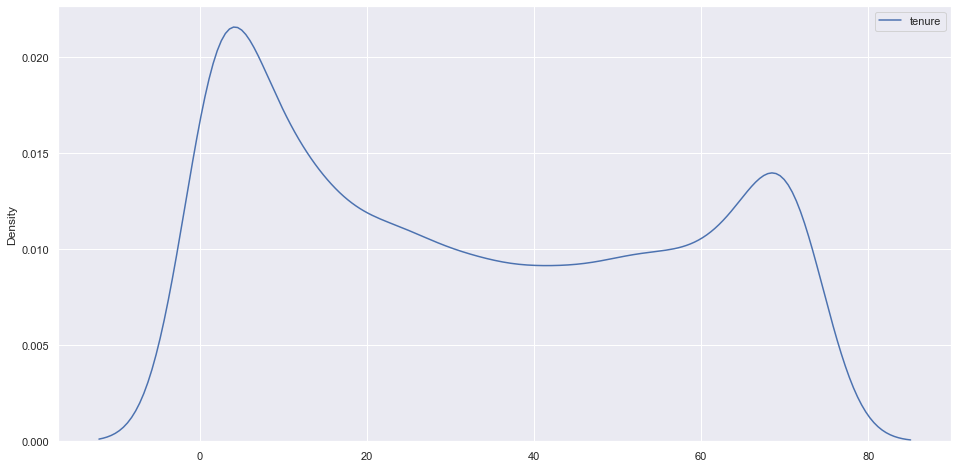

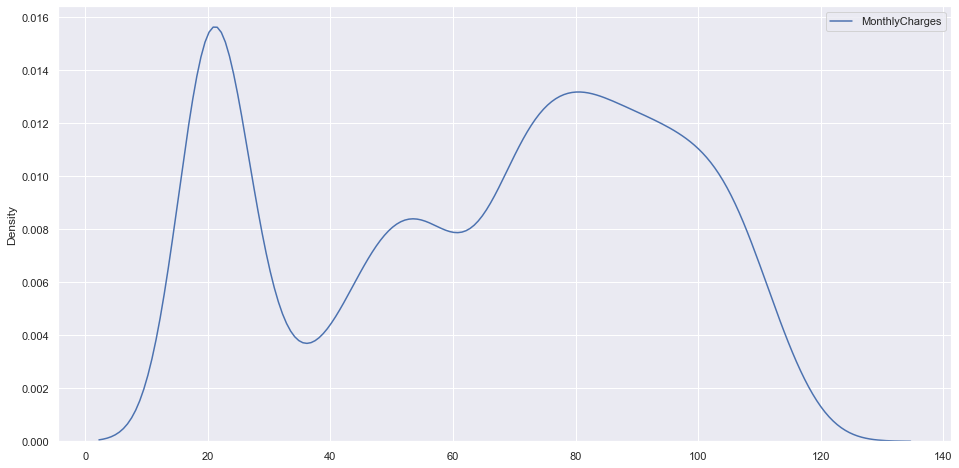

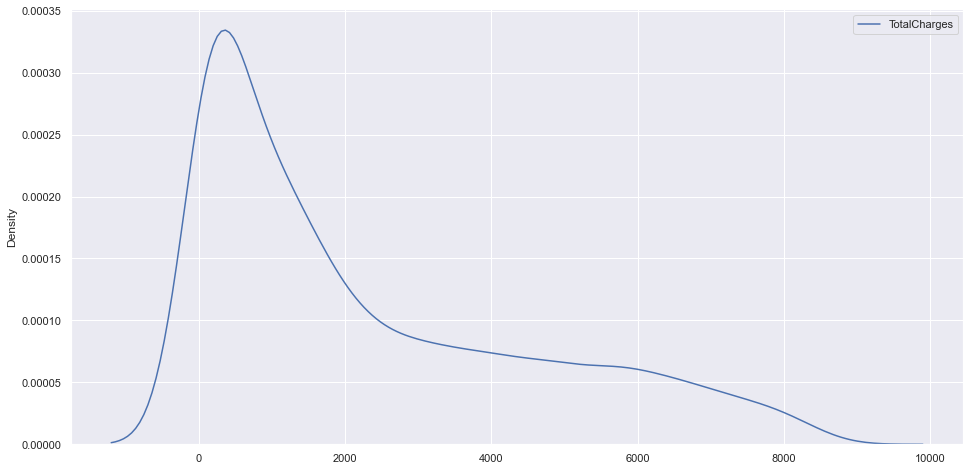

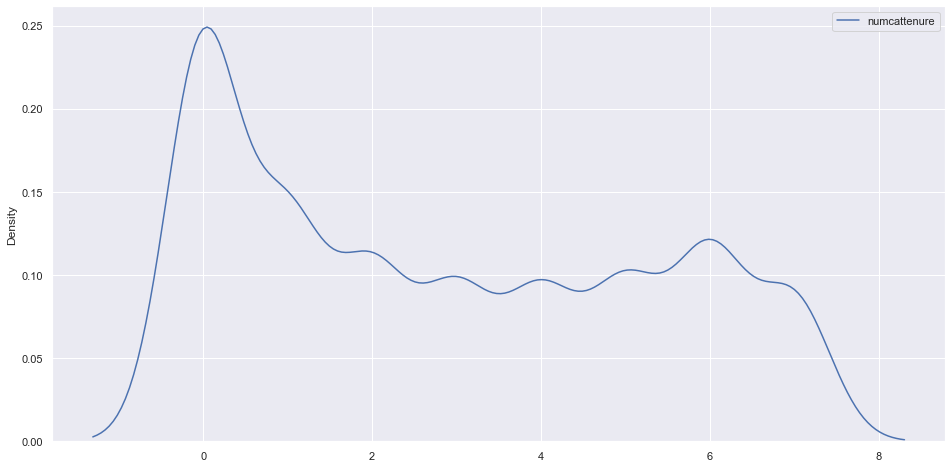

In [43]:
f = plt.figure(figsize=(16,8))
sb.kdeplot(data = tenure)

f = plt.figure(figsize=(16,8))
sb.kdeplot(data = mcharges)

f = plt.figure(figsize=(16,8))
sb.kdeplot(data = tcharges)


f = plt.figure(figsize=(16,8))
sb.kdeplot(data = ctenure)

tenure.skew()
mcharges.skew()
tcharges.skew()
ctenure.skew()

<AxesSubplot:>

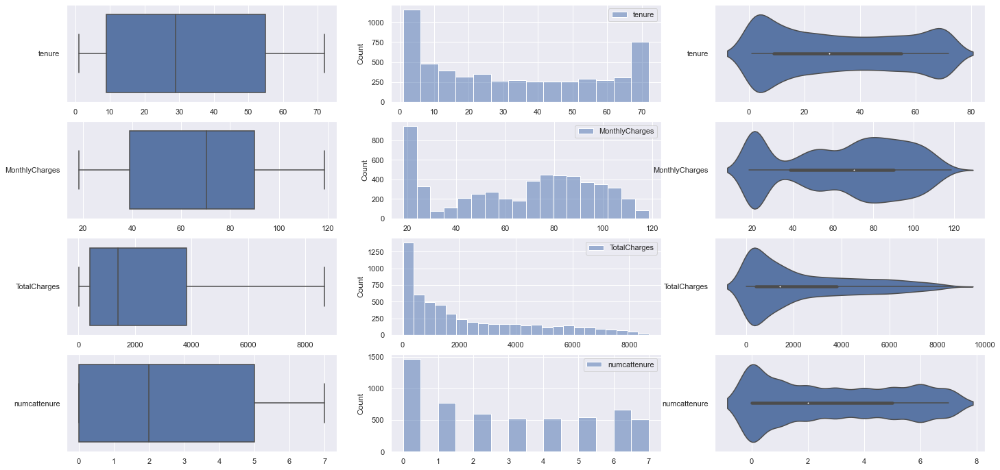

In [44]:
# Set up matplotlib figure with one subplots
f, axes = plt.subplots(4, 3, figsize=(24, 12))

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = tenure, orient = "h", ax = axes[0,0])
sb.histplot(data = tenure, ax = axes[0,1])
sb.violinplot(data = tenure, orient = "h", ax = axes[0,2])

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = mcharges, orient = "h", ax = axes[1,0])
sb.histplot(data = mcharges, ax = axes[1,1])
sb.violinplot(data = mcharges, orient = "h", ax = axes[1,2])

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = tcharges, orient = "h", ax = axes[2,0])
sb.histplot(data = tcharges, ax = axes[2,1])
sb.violinplot(data = tcharges, orient = "h", ax = axes[2,2])

# Plot the basic uni-variate figures for jointDF
sb.boxplot(data = ctenure, orient = "h", ax = axes[3,0])
sb.histplot(data = ctenure, ax = axes[3,1])
sb.violinplot(data = ctenure, orient = "h", ax = axes[3,2])


In [45]:
ChurnMonthlyCharges = pd.DataFrame(train['MonthlyCharges'])
print("Data type : ", type(ChurnMonthlyCharges))
print("Data dims : ", ChurnMonthlyCharges.size)
ChurnMonthlyCharges.head()

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  5625


,MonthlyCharges
#,
893,81.10
2285,55.90
2499,53.80
4198,84.75
4424,66.40


In [46]:
NoChurnMonthlyCharges = pd.DataFrame(train['MonthlyCharges'])
print("Data type : ", type(NoChurnMonthlyCharges))
print("Data dims : ", NoChurnMonthlyCharges.size)
NoChurnMonthlyCharges.head()

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  5625


,MonthlyCharges
#,
893,81.10
2285,55.90
2499,53.80
4198,84.75
4424,66.40


<AxesSubplot:>

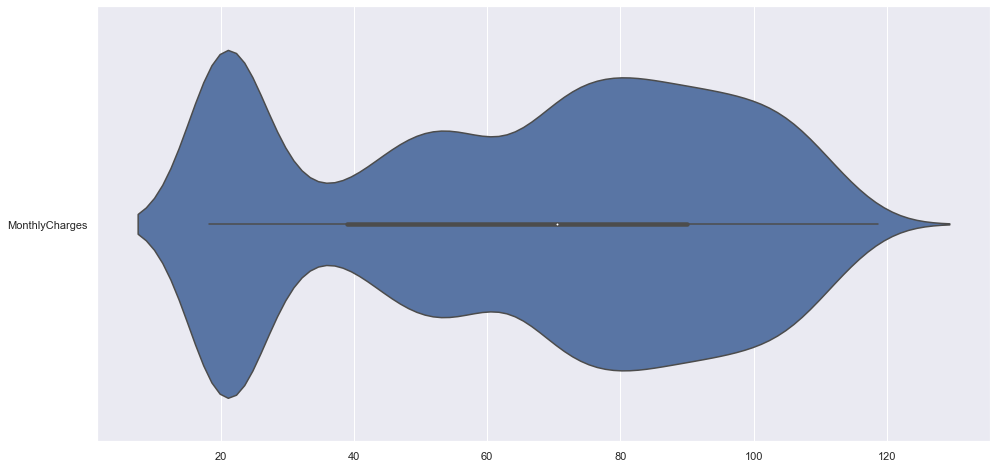

In [47]:
f = plt.figure(figsize=(16, 8))
sb.violinplot(data = ChurnMonthlyCharges, orient = "h")

In [48]:
ChurnTotalCharges = pd.DataFrame(train['TotalCharges'])
print("Data type : ", type(ChurnTotalCharges))
print("Data dims : ", ChurnTotalCharges.size)
ChurnTotalCharges.head()

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  5625


,TotalCharges
#,
893,2619.25
2285,157.55
2499,1389.85
4198,1816.75
4424,2245.40


<AxesSubplot:>

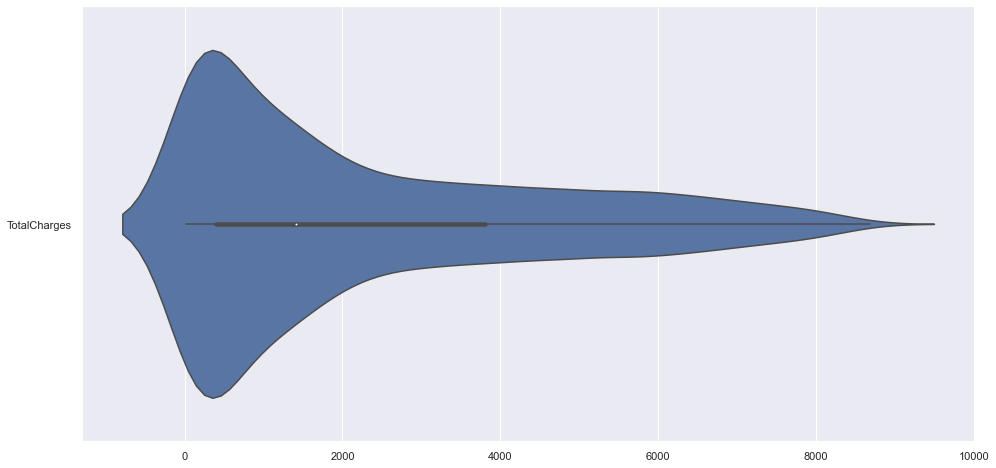

In [49]:
f = plt.figure(figsize=(16, 8))
sb.violinplot(data = ChurnTotalCharges, orient = "h")

# 2. Exploratory Data Analysis

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [51]:
train

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
893,1,1,0,0,32,1,1,1,0,0,...,0,0,0,0,1,1,81.10,2619.25,0,3
2285,1,0,0,1,3,1,0,0,1,0,...,0,0,0,0,0,3,55.90,157.55,0,0
2499,1,0,1,0,27,1,0,0,0,1,...,1,0,0,0,1,2,53.80,1389.85,0,2
4198,0,0,0,1,22,1,1,1,0,0,...,0,0,1,0,1,2,84.75,1816.75,0,2
4424,1,0,0,0,33,1,0,0,0,1,...,0,1,0,0,1,1,66.40,2245.40,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5039,0,0,0,0,10,1,0,2,0,0,...,0,0,0,1,1,3,19.30,185.20,0,1
6032,0,1,1,1,12,0,0,0,0,0,...,1,0,0,0,1,3,29.30,355.90,0,1
4312,0,0,0,0,7,0,0,0,0,1,...,0,0,1,0,1,1,40.10,293.30,1,0


In [52]:
train.describe()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
count,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,...,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000
mean,0.502933,0.161067,0.477333,0.294756,32.356089,0.906489,0.425067,0.871111,0.288533,0.344178,...,0.290133,0.391111,0.391467,0.687289,0.595556,1.573511,65.088204,2293.533049,0.265067,2.842844
std,0.500036,0.367625,0.499530,0.455973,24.482379,0.291173,0.494397,0.735644,0.453121,0.475142,...,0.453864,0.488043,0.488122,0.831131,0.490828,1.069247,30.034773,2272.551734,0.441408,2.448440
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,38.900000,403.150000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,29.000000,1.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,70.450000,1406.000000,0.000000,2.000000
75%,1.000000,0.000000,1.000000,1.000000,55.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,90.000000,3808.000000,1.000000,5.000000
max,1.000000,1.000000,1.000000,1.000000,72.000000,1.000000,1.000000,2.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,2.000000,1.000000,3.000000,118.650000,8684.800000,1.000000,7.000000


# Distribution and Skewness Chart

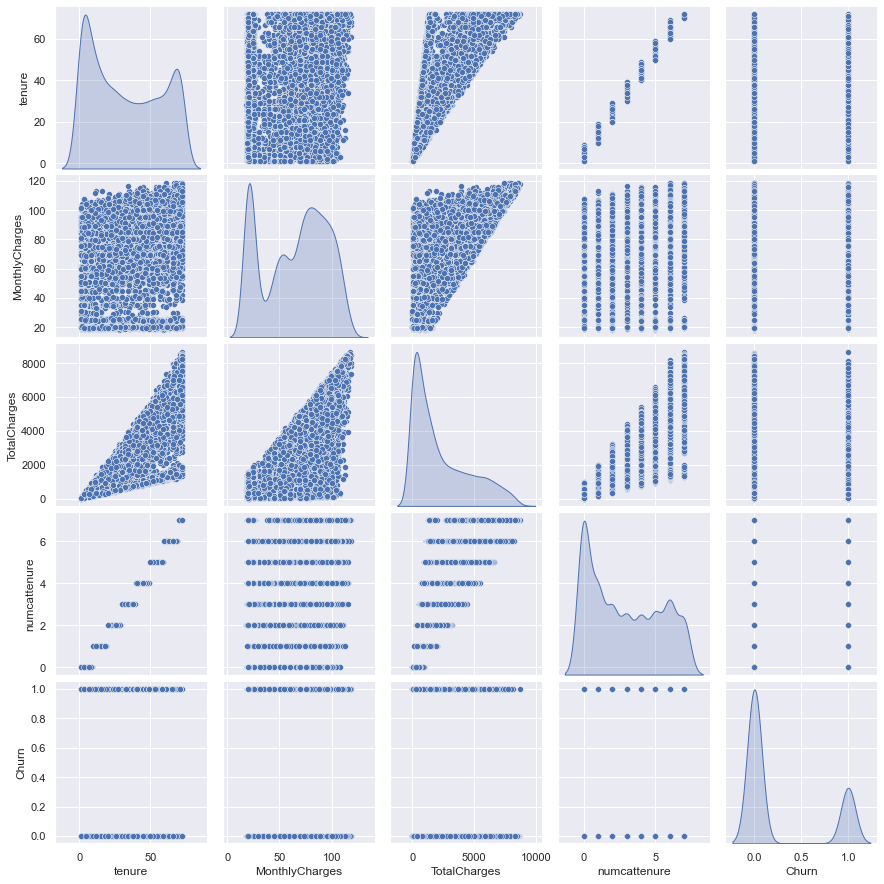

In [53]:
#Separating columns to be visualized
out_cols = list(set(train.nunique()[train.nunique()<6].keys().tolist()
                    + train.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in train.columns if x not in out_cols] + ['Churn']

sns.pairplot(train[viz_cols], diag_kind="kde")
plt.show()

There is a positive skewed chart for total charges. There is no normal distribution curve from the data.

# Churn Rate

# Tenure VS Monthly Charges

<AxesSubplot:xlabel='tenure', ylabel='MonthlyCharges'>

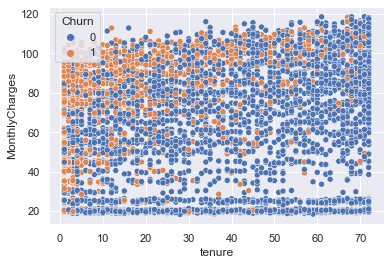

In [54]:
sns.scatterplot(data=train, x="tenure", y="MonthlyCharges", hue="Churn")

From the graph above, we can see that churned customers are concentrated towards the left of tenure - meaning the lesser tenure the more likely they will churn. This could mean that if they are holding onto prepaid (short-term mobile plans) or newly signed up member, the possibility of churn rate is high within the first 15 years.

# Churn - Tenure VS Monthly Charges - Gender

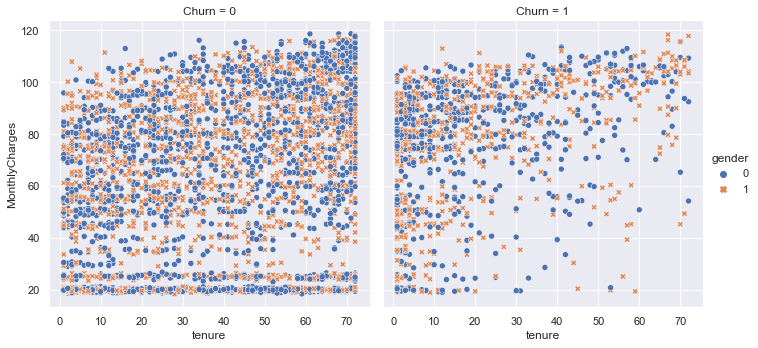

In [55]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="gender", style="gender",
    kind="scatter"
)

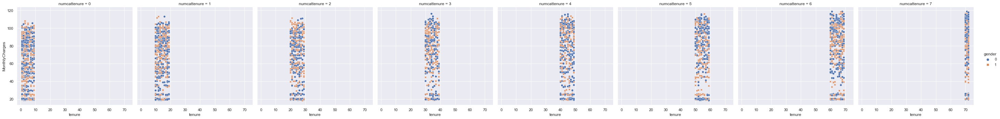

In [56]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="numcattenure", hue="gender", style="gender",
    kind="scatter"
)

To dive deeper into the customer profile, we took Gender as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. There seems to be no distint relationship.

# Churn - Tenure VS Monthly Charges - SeniorCitizen

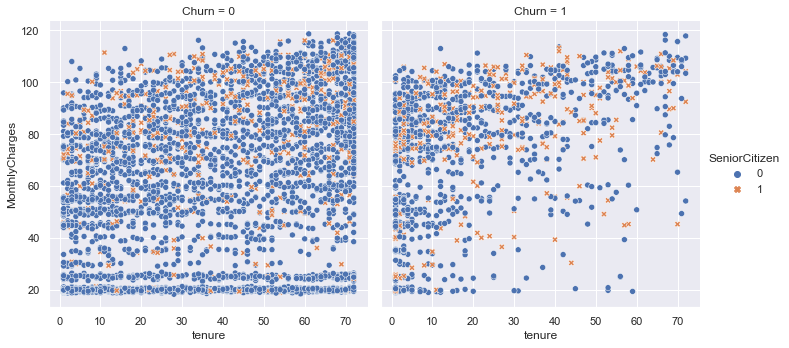

In [57]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="SeniorCitizen", style="SeniorCitizen",
    kind="scatter"
)

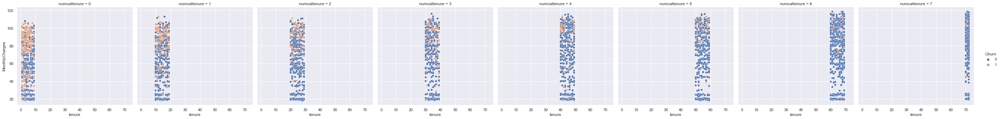

In [58]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="numcattenure", hue="Churn", style="Churn",
    kind="scatter"
)

To dive deeper into the customer profile, we took Gender as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. There seems to be no distint relationship as the data is skewed towards customers with 0 as senior citizen.

# Churn - Tenure VS Monthly Charges - Partner

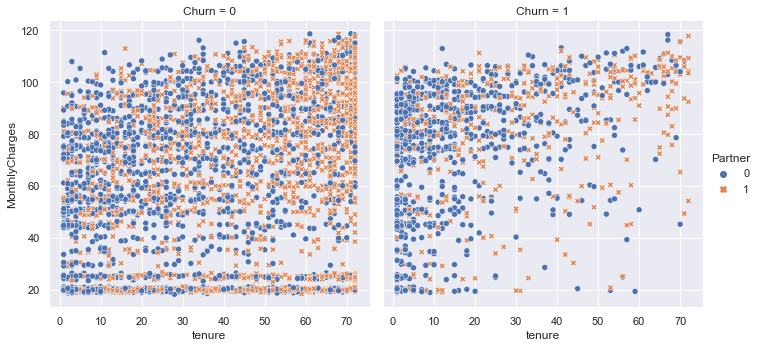

In [59]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="Partner", style="Partner",
    kind="scatter"
)

To dive deeper into the customer profile, we took Partner as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. For churned customers, there seems to be people who are single (with no partner), concentrated between 0 to 20 tenure with high monthly charges.

# Churn - Tenure VS Monthly Charges - Dependents

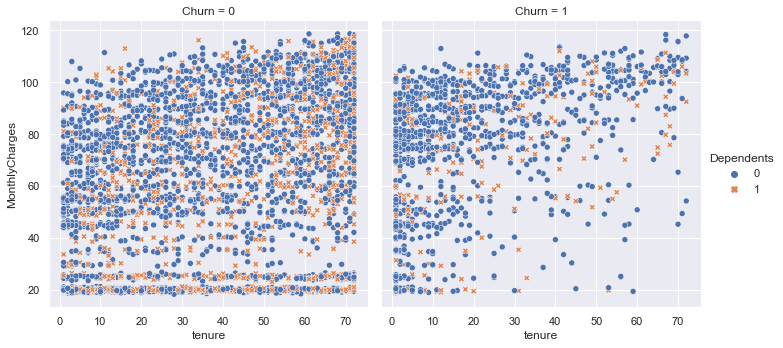

In [60]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="Dependents", style="Dependents",
    kind="scatter"
)

To dive deeper into the customer profile, we took Dependents as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. For churned customers, there seems to be people who have no dependents with high monthly charges.

# Churn - Tenure VS Monthly Charges - PhoneService

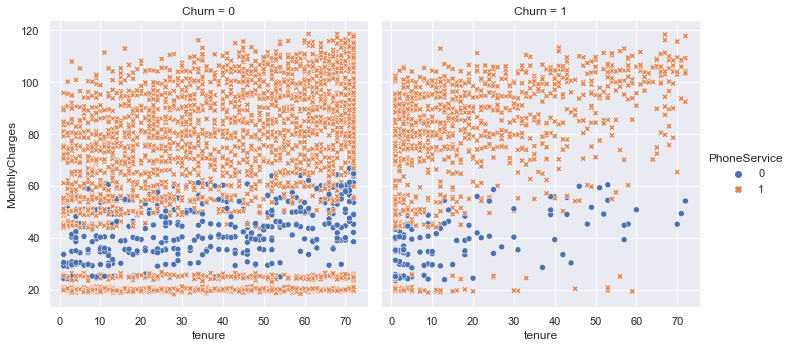

In [61]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="PhoneService", style="PhoneService",
    kind="scatter"
)

To dive deeper into the customer profile, we took PhoneService as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. The dataset is skewed towards clients with phone service.

# Churn - Tenure VS Monthly Charges - MultipleLines

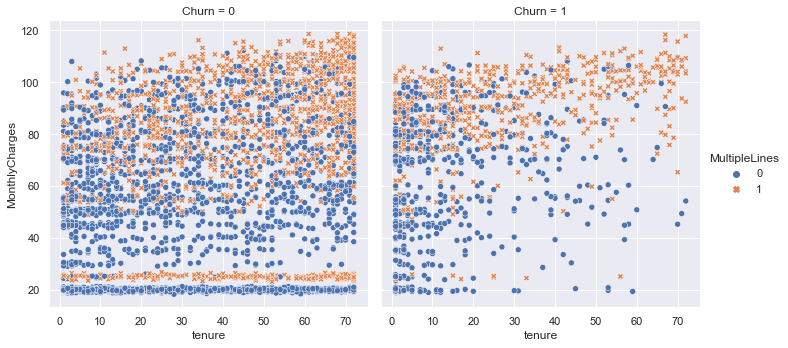

In [62]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="MultipleLines", style="MultipleLines",
    kind="scatter"
)

To dive deeper into the customer profile, we took MultipleLines as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. No clear relationship.

# Churn - Tenure VS Monthly Charges - InternetService

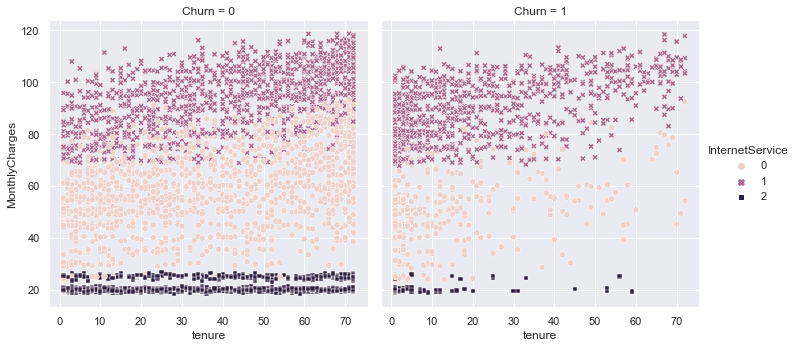

In [63]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="InternetService", style="InternetService",
    kind="scatter"
)

To dive deeper into the customer profile, we took InternetService as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. This graph shows a clear distint that with DSL internet service, the monthly charges is the highest. Fiber Optic internet service remains 2nd highest with no internet service as the lowest monthly charges.

# Churn - Tenure VS Monthly Charges - Contract

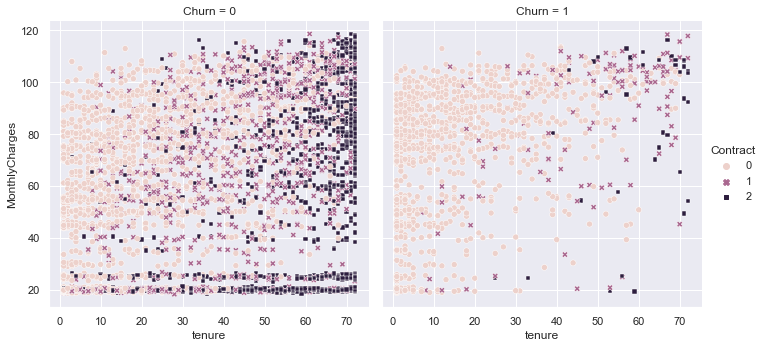

In [64]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="Contract", style="Contract",
    kind="scatter"
)

To dive deeper into the customer profile, we took Contract as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. Those who churned are majority of people with monthly contract. In order to retain customers, 2 year contracts sees a higher loyal customers.

# Churn - Tenure VS Monthly Charges - PaperlessBilling

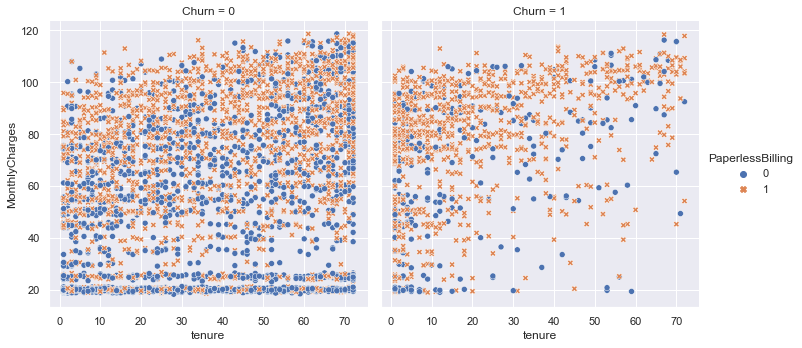

In [65]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="PaperlessBilling", style="PaperlessBilling",
    kind="scatter"
)

To dive deeper into the customer profile, we took Paperless Billing as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. No clear relationship.

# Churn - Tenure VS Monthly Charges - PaymentMethod

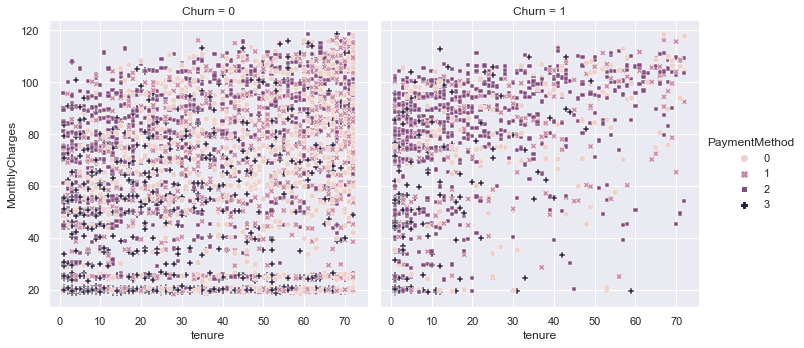

In [66]:
sns.relplot(
    data=train, x="tenure", y="MonthlyCharges",
    col="Churn", hue="PaymentMethod", style="PaymentMethod",
    kind="scatter"
)

To dive deeper into the customer profile, we took Payment Method as the key attribute to see if there is any relationship of churn and non-churn with respect to monthly charges vs tenure graph. No clear relationship.

Number of Churn : 2
0    4134
1    1491
Name: Churn, dtype: int64


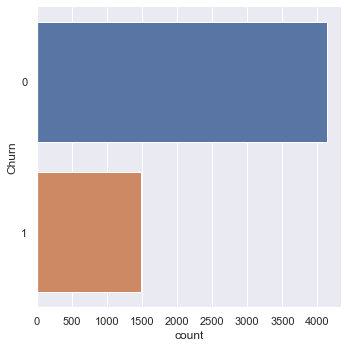

In [67]:
print("Number of Churn :", len(train["Churn"].unique()))

print(train["Churn"].value_counts())
sb.catplot(y = "Churn", data = train, kind = "count")

In [68]:
(1501/4124)*100

36.39670223084384

# Based on Tenure VS Churn, we see that cat 1 churn the most. Less than 10 years tenure, customers are not loyal - about 50% churn. A reduction of 5% churn if they move to cat 2 and 20% if they move to cat 3. At cat 8 (highest in our dataset) there is almost 0% churn rate.

Gender Distribution : 2
1    2829
0    2796
Name: gender, dtype: int64


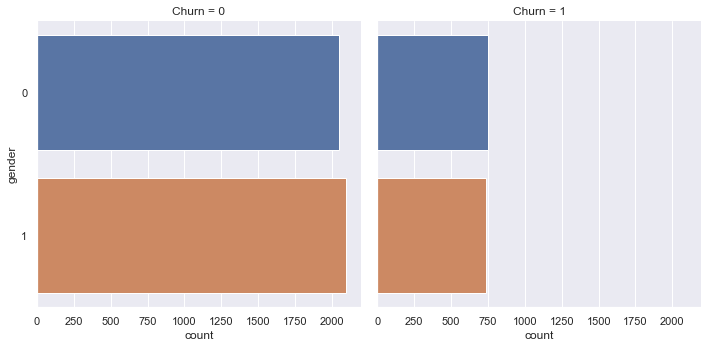

In [69]:
print("Gender Distribution :", len(train["gender"].unique()))

print(train["gender"].value_counts())
sb.catplot(y = "gender", data = train, kind = "count", col="Churn")

# Insightful knowledge that for every 100 customers, about 36 people will churn - making it about 36.4% churn rate

In [70]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5625 entries, 893 to 3868
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            5625 non-null   int64  
 1   SeniorCitizen     5625 non-null   int64  
 2   Partner           5625 non-null   int64  
 3   Dependents        5625 non-null   int64  
 4   tenure            5625 non-null   int64  
 5   PhoneService      5625 non-null   int64  
 6   MultipleLines     5625 non-null   int64  
 7   InternetService   5625 non-null   int64  
 8   OnlineSecurity    5625 non-null   int64  
 9   OnlineBackup      5625 non-null   int64  
 10  DeviceProtection  5625 non-null   int64  
 11  TechSupport       5625 non-null   int64  
 12  StreamingTV       5625 non-null   int64  
 13  StreamingMovies   5625 non-null   int64  
 14  Contract          5625 non-null   int64  
 15  PaperlessBilling  5625 non-null   int64  
 16  PaymentMethod     5625 non-null   int64 

In [71]:
# Extract only the numeric data variables
# include CAT TENURE

compare_numDF = pd.DataFrame(train[["MonthlyCharges", "TotalCharges", "tenure"]])

# Summary Statistics for all Variables
compare_numDF.describe()

,MonthlyCharges,TotalCharges,tenure
count,5625.000000,5625.000000,5625.000000
mean,65.088204,2293.533049,32.356089
std,30.034773,2272.551734,24.482379
min,18.250000,18.800000,1.000000
25%,38.900000,403.150000,9.000000
50%,70.450000,1406.000000,29.000000
75%,90.000000,3808.000000,55.000000
max,118.650000,8684.800000,72.000000


In [72]:
# Calculate the complete  correlation matrix
compare_numDF.corr()

,MonthlyCharges,TotalCharges,tenure
MonthlyCharges,1.000000,0.653768,0.254840
TotalCharges,0.653768,1.000000,0.828933
tenure,0.254840,0.828933,1.000000


<AxesSubplot:>

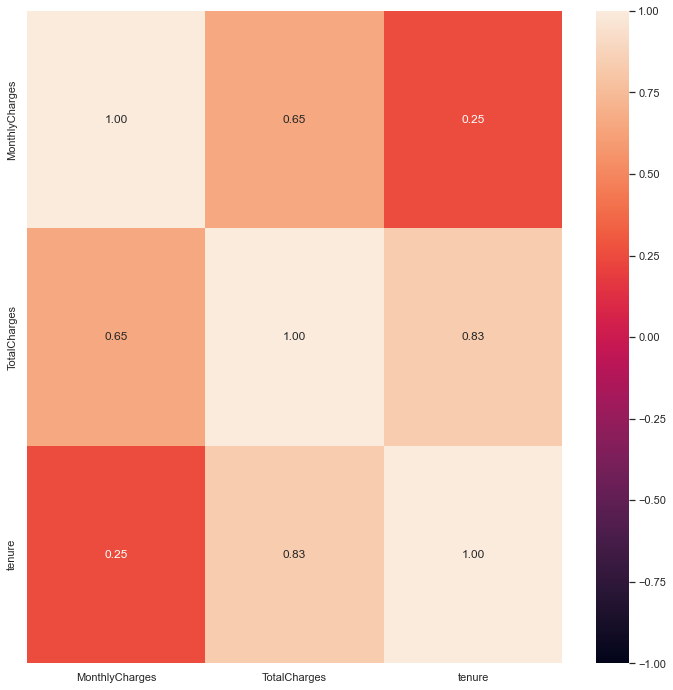

In [73]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(12, 12))
sb.heatmap(compare_numDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

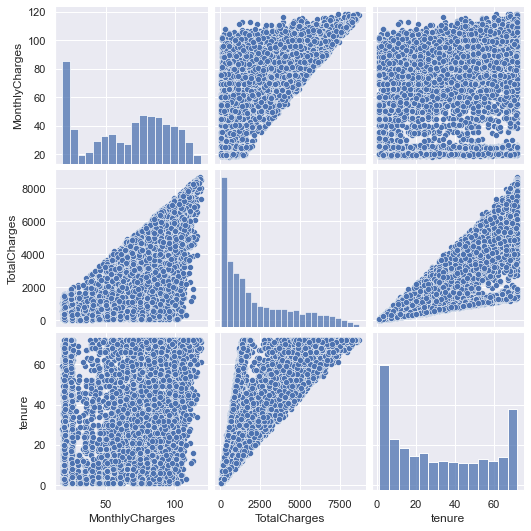

In [74]:
# Draw pairs of variables against one another
sb.pairplot(data = compare_numDF)

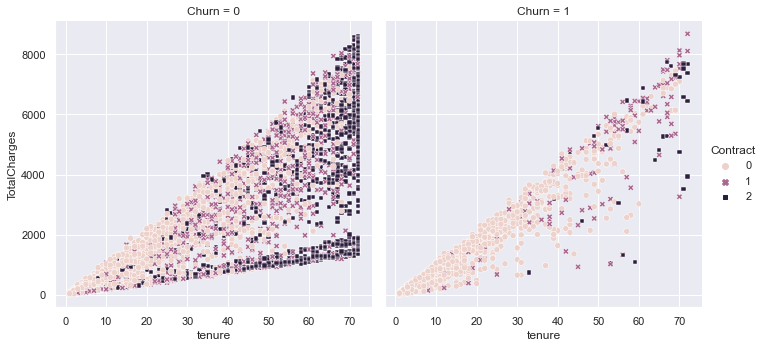

In [75]:
sns.relplot(
    data=train, x="tenure", y="TotalCharges",
    col="Churn", hue="Contract", style="Contract",
    kind="scatter"
)

In [76]:
train.loc[train["Churn"] == 1]

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
525,1,0,1,0,34,1,1,1,0,0,...,0,1,1,0,1,2,100.05,3480.00,1,3
2005,1,0,0,0,24,1,1,1,0,0,...,0,1,0,0,1,3,89.85,2165.05,1,2
1339,1,0,0,0,1,1,0,2,0,0,...,0,0,0,0,0,3,20.15,20.15,1,0
2721,1,0,0,0,15,1,1,0,0,0,...,0,0,0,0,0,2,51.55,765.50,1,1
3247,1,0,0,0,3,1,0,0,0,0,...,0,1,0,0,0,3,55.15,159.15,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2590,1,1,0,0,3,1,1,1,0,0,...,0,0,0,0,1,2,76.05,231.80,1,0
420,0,1,0,0,1,1,0,1,0,0,...,0,0,0,0,1,0,75.30,75.30,1,0
2574,0,0,0,0,1,1,0,0,0,0,...,0,0,1,0,1,3,54.75,54.75,1,0


<AxesSubplot:>

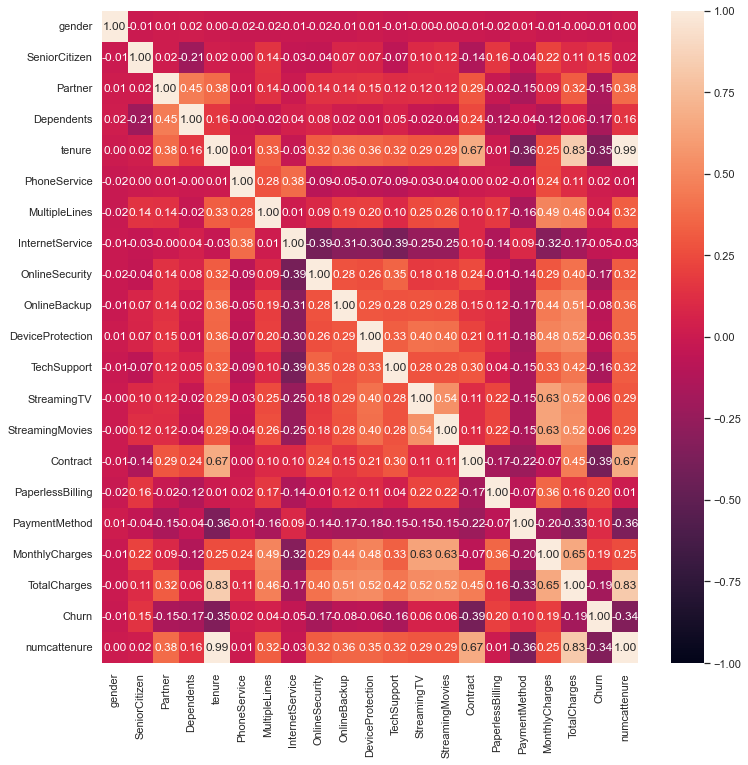

In [77]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(12, 12))
sb.heatmap(train.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

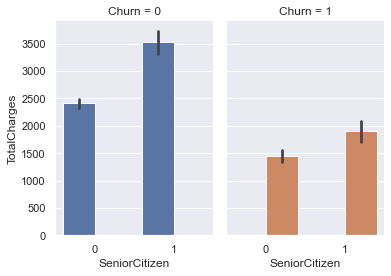

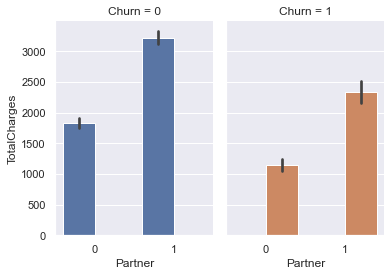

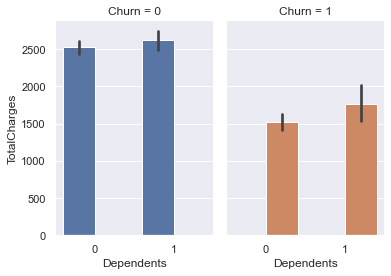

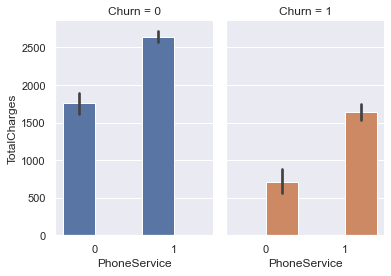

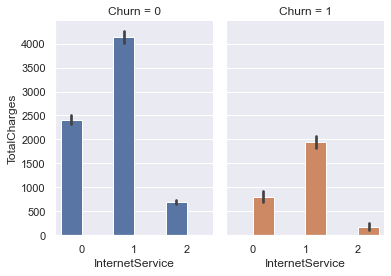

...

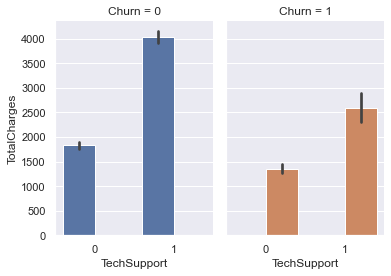

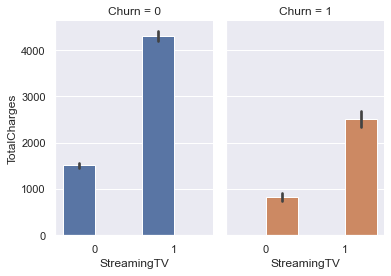

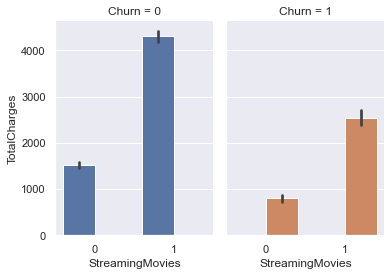

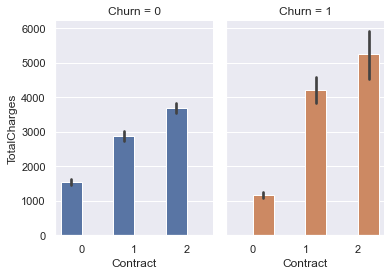

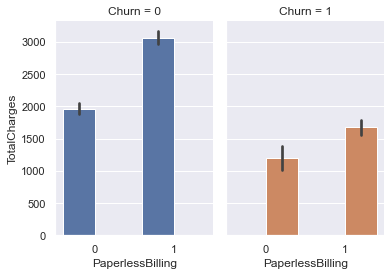

In [78]:
a = sns.catplot(x="SeniorCitizen", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
b = sns.catplot(x="Partner", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
c = sns.catplot(x="Dependents", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
d = sns.catplot(x="PhoneService", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
e = sns.catplot(x="InternetService", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
f = sns.catplot(x="PaymentMethod", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
g = sns.catplot(x="OnlineSecurity", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
h = sns.catplot(x="TechSupport", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
i = sns.catplot(x="StreamingTV", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
j = sns.catplot(x="StreamingMovies", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
k = sns.catplot(x="Contract", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);
l = sns.catplot(x="PaperlessBilling", y="TotalCharges",
                hue="Churn", col="Churn",
                data=train, kind="bar",
                height=4, aspect=.7);

# If there are people not subscribed to phone what are they subscribing for?

Majority of subscribers are with phone service. With phone service, the churn rate is about 36%. 

# If no phoneservice is the contract period shorter?

Surprisingly, even with no phone service, the churn rate is about 33% churn rate. 

In [79]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics
import plotly.express as px

In [80]:
# Histogram of Numeric across Categorical with Marginals
fig = px.histogram(train, x = "tenure", color = "Churn", marginal = "box")
fig.show()

In [81]:
# Histogram of Numeric across Categorical with Marginals
fig = px.histogram(train, x = "MonthlyCharges", color = "Churn", marginal = "box")
fig.show()

In [82]:
# Scatter Matrix for Numerics across Categorical
fig = px.scatter_matrix(train, 
                        dimensions=["tenure", "MonthlyCharges", "TotalCharges"], 
                        color = "Churn")
fig.show()

In [83]:
full_dataframe

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
1,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,1,2,29.85,29.85,0,0
2,1,0,0,0,34,1,0,0,1,0,...,0,0,0,1,0,3,56.95,1889.50,0,3
3,1,0,0,0,2,1,0,0,1,1,...,0,0,0,0,1,3,53.85,108.15,1,0
4,1,0,0,0,45,0,0,0,1,0,...,1,0,0,1,0,0,42.30,1840.75,0,4
5,0,0,0,0,2,1,0,1,0,0,...,0,0,0,0,1,2,70.70,151.65,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7039,1,0,1,1,24,1,1,0,1,0,...,1,1,1,1,1,3,84.80,1990.50,0,2
7040,0,0,1,1,72,1,1,1,0,1,...,0,1,1,1,1,1,103.20,7362.90,0,7
7041,0,0,1,1,11,0,0,0,1,0,...,0,0,0,0,1,2,29.60,346.45,0,1


In [84]:
catvpay = pd.DataFrame(full_dataframe[['numcattenure','PhoneService','MultipleLines','MonthlyCharges','TotalCharges','Churn']])
catvpay

,numcattenure,PhoneService,MultipleLines,MonthlyCharges,TotalCharges,Churn
#,,,,,,
1,0,0,0,29.85,29.85,0
2,3,1,0,56.95,1889.50,0
3,0,1,0,53.85,108.15,1
4,4,0,0,42.30,1840.75,0
5,0,1,0,70.70,151.65,1
...,...,...,...,...,...,...
7039,2,1,1,84.80,1990.50,0
7040,7,1,1,103.20,7362.90,0
7041,1,0,0,29.60,346.45,0


0    1843
1     953
6     832
2     762
5     690
3     653
7     651
4     648
Name: numcattenure, dtype: int64


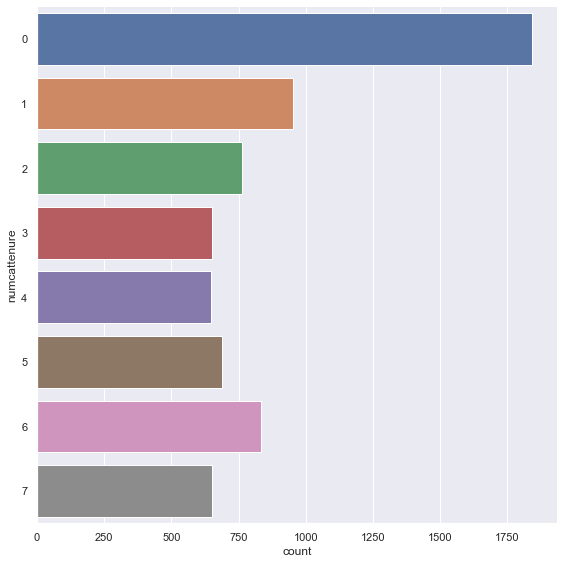

In [85]:
print(catvpay["numcattenure"].value_counts())
sb.catplot(y = "numcattenure", data = catvpay, kind = "count", height = 8)

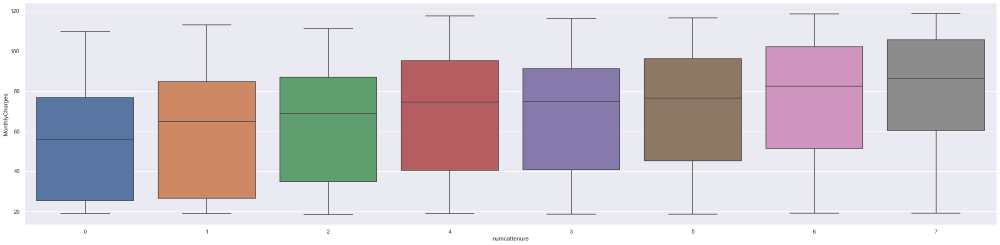

In [86]:
sb.catplot(data=catvpay, x='numcattenure', y='MonthlyCharges', height=7, aspect=4, kind="box"
           ,order=catvpay.groupby('numcattenure')['MonthlyCharges'].median().sort_values().index)

# Which category will most likely to churn?

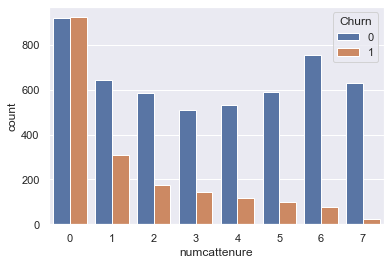

In [87]:
fig_churn_phone_service = sns.countplot(x="numcattenure",hue="Churn",data=catvpay)
plt.show()

# Predicting Churn using all other variables

In [88]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

# Extract Response and Predictors
y = pd.DataFrame(full_dataframe['Churn'])
X = pd.DataFrame(full_dataframe[['gender', 'SeniorCitizen', 'Partner','Dependents', 'tenure', 'PhoneService','MultipleLines', 'InternetService', 'OnlineSecurity','OnlineBackup', 'DeviceProtection', 'TechSupport','StreamingTV', 'StreamingMovies', 'Contract','PaperlessBilling', 'PaymentMethod', 'MonthlyCharges','TotalCharges']])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 4)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

DecisionTreeClassifier(max_depth=4)

[Text(1395.0, 2446.2, 'Contract <= 0.5\ngini = 0.389\nsamples = 5625\nvalue = [4135, 1490]\nclass = N'),
 Text(697.5, 1902.6, 'MonthlyCharges <= 67.675\ngini = 0.489\nsamples = 3093\nvalue = [1777, 1316]\nclass = N'),
 Text(348.75, 1359.0, 'tenure <= 5.5\ngini = 0.416\nsamples = 1303\nvalue = [919, 384]\nclass = N'),
 Text(174.375, 815.3999999999999, 'InternetService <= 1.0\ngini = 0.487\nsamples = 568\nvalue = [330, 238]\nclass = N'),
 Text(87.1875, 271.7999999999997, 'gini = 0.5\nsamples = 342\nvalue = [166, 176]\nclass = Y'),
 Text(261.5625, 271.7999999999997, 'gini = 0.398\nsamples = 226\nvalue = [164, 62]\nclass = N'),
 Text(523.125, 815.3999999999999, 'PhoneService <= 0.5\ngini = 0.318\nsamples = 735\nvalue = [589, 146]\nclass = N'),
 Text(435.9375, 271.7999999999997, 'gini = 0.424\nsamples = 203\nvalue = [141, 62]\nclass = N'),
 Text(610.3125, 271.7999999999997, 'gini = 0.266\nsamples = 532\nvalue = [448, 84]\nclass = N'),
 Text(1046.25, 1359.0, 'tenure <= 14.5\ngini = 0.499\nsa

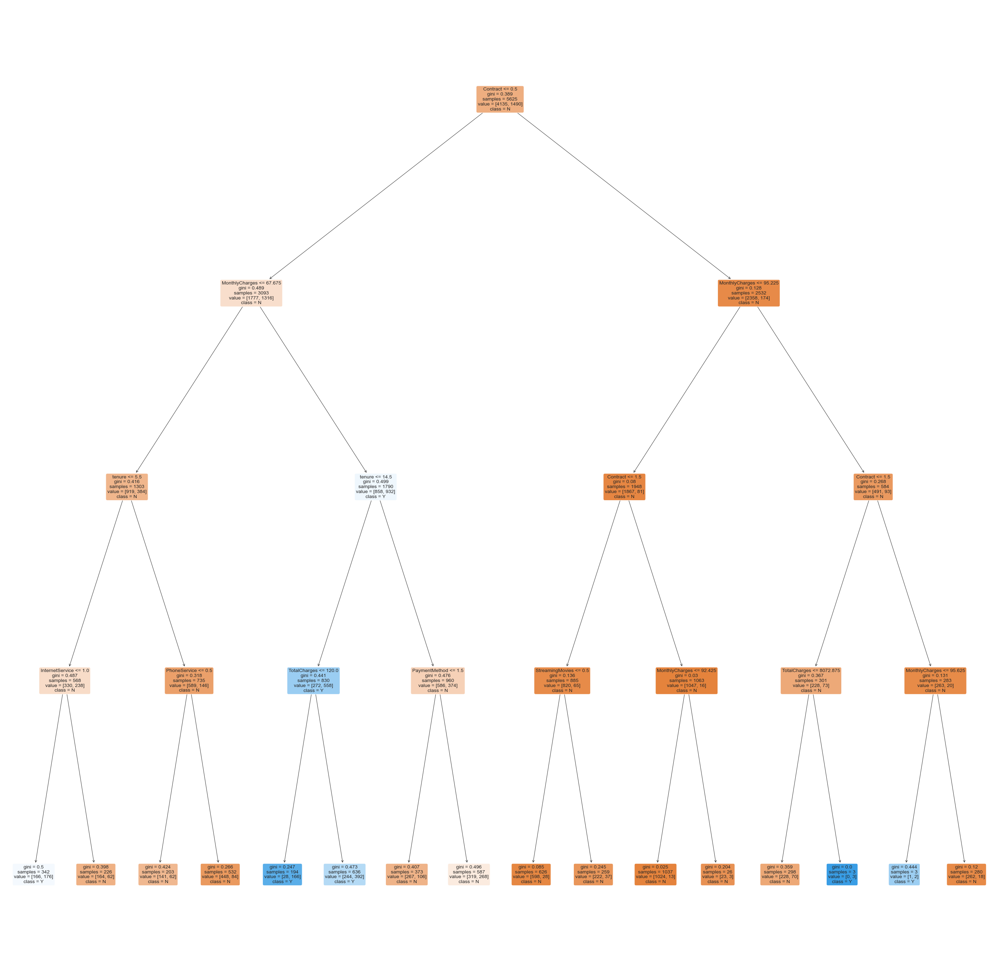

In [89]:
# Plot the trained Decision Tree
from sklearn.tree import plot_tree

f = plt.figure(figsize=(50,50))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train.columns, 
          class_names=["N","Y"])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy :	 0.7884444444444444

TPR Train :	 0.4959731543624161
TNR Train :	 0.8938331318016929

FPR Train :	 0.10616686819830713
FNR Train :	 0.5040268456375839


<AxesSubplot:>

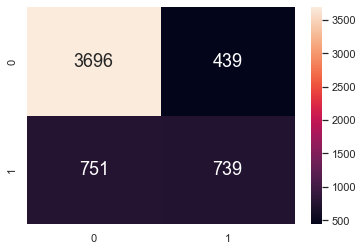

In [90]:
# Import the required metric from sklearn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)

# Print the Classification Accuracy
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy :\t", dectree.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Y (1) predicted Y (1)
fpTrain = cmTrain[0][1] # False Positives : N (0) predicted Y (1)
tnTrain = cmTrain[0][0] # True Negatives : N (0) predicted N (0)
fnTrain = cmTrain[1][0] # False Negatives : Y (1) predicted N (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Goodness of Fit of Model 	Test Dataset
Classification Accuracy :	 0.7874911158493249

TPR Test :	 0.525065963060686
TNR Test :	 0.8842412451361867

FPR Test :	 0.11575875486381323
FNR Test :	 0.47493403693931396


<AxesSubplot:>

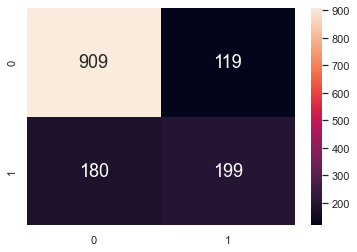

In [91]:
# Import the required metric from sklearn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_test_pred = dectree.predict(X_test)

# Print the Classification Accuracy
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy :\t", dectree.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTest = confusion_matrix(y_test, y_test_pred)
tpTest = cmTest[1][1] # True Positives : Y (1) predicted Y (1)
fpTest = cmTest[0][1] # False Positives : N (0) predicted Y (1)
tnTest = cmTest[0][0] # True Negatives : N (0) predicted N (0)
fnTest = cmTest[1][0] # False Negatives : Y (1) predicted N (0)

print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()

print("FPR Test :\t", (fpTest/(fpTest + tnTest)))
print("FNR Test :\t", (fnTest/(fnTest + tpTest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [92]:
train.head()


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
#,,,,,,,,,,,,,,,,,,,,,
893,1,1,0,0,32,1,1,1,0,0,...,0,0,0,0,1,1,81.10,2619.25,0,3
2285,1,0,0,1,3,1,0,0,1,0,...,0,0,0,0,0,3,55.90,157.55,0,0
2499,1,0,1,0,27,1,0,0,0,1,...,1,0,0,0,1,2,53.80,1389.85,0,2
4198,0,0,0,1,22,1,1,1,0,0,...,0,0,1,0,1,2,84.75,1816.75,0,2
4424,1,0,0,0,33,1,0,0,0,1,...,0,1,0,0,1,1,66.40,2245.40,0,3


# Random Forest Classifier

Random forest is a Supervised Machine Learning Algorithm that is used widely in Classification and Regression problems. It builds decision trees on different samples and takes their majority vote for classification and average in case of regression.

In [121]:
# Import essential models and functions from sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
y = pd.DataFrame(full_dataframe['Churn'])
X = pd.DataFrame(full_dataframe.drop('Churn', axis = 1))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)
rforest = RandomForestClassifier(n_estimators = 300, 
                                 max_depth = 9)       
rforest.fit(X_train, y_train.Churn.ravel())

RandomForestClassifier(max_depth=9, n_estimators=300)

Goodness of Fit of Model 	Test Dataset
Classification Accuracy :	 0.860219422998781

TPR Train :	 0.6114942528735632
TNR Train :	 0.9499585291678186

FPR Train :	 0.05004147083218136
FNR Train :	 0.38850574712643676


<AxesSubplot:>

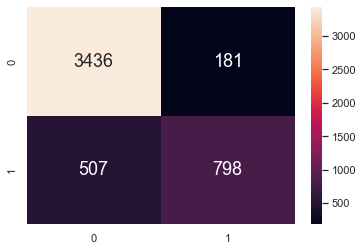

In [122]:
from sklearn.metrics import confusion_matrix
y_train_pred = rforest.predict(X_train)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy :\t", rforest.score(X_train, y_train))
print()
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] 
fpTrain = cmTrain[0][1]
tnTrain = cmTrain[0][0]
fnTrain = cmTrain[1][0]
print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()
print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Goodness of Fit of Model 	Test Dataset
Classification Accuracy :	 0.860219422998781

TPR Test :	 0.5106382978723404
TNR Test :	 0.9191461836998707

FPR Test :	 0.08085381630012936
FNR Test :	 0.48936170212765956


<AxesSubplot:>

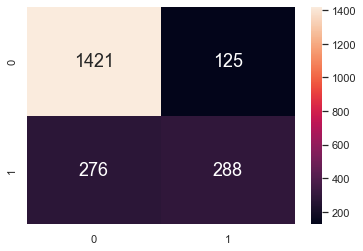

In [123]:
from sklearn.metrics import confusion_matrix
y_test_pred = rforest.predict(X_test)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy :\t", rforest.score(X_train, y_train))
print()
cmTest = confusion_matrix(y_test, y_test_pred)
tpTest = cmTest[1][1] 
fpTest = cmTest[0][1]   
tnTest = cmTest[0][0]
fnTest = cmTest[1][0]
print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()
print("FPR Test :\t", (fpTest/(fpTest + tnTest)))
print("FNR Test :\t", (fnTest/(fnTest + tpTest)))
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [124]:
##Hyper parameter testing, to be revised
from sklearn.model_selection import GridSearchCV

# Define the Hyper-parameter Grid to search on, in case of Random Forest
param_grid = {'n_estimators': np.arange(100,1001,100),   # number of trees 100, 200, ..., 1000
              'max_depth': np.arange(2, 11)}             # depth of trees 2, 3, 4, 5, ..., 10

# Create the Hyper-parameter Grid
hpGrid = GridSearchCV(RandomForestClassifier(),   # the model family
                      param_grid,                 # the search grid
                      cv = 5,                     # 5-fold cross-validation
                      scoring = 'accuracy')       # score to evaluate

# Train the models using Cross-Validation
hpGrid.fit(X_train, y_train.Churn.ravel())

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                         'n_estimators': array([ 100,  200,  300,  400,  500,  600,  700,  800,  900, 1000])},
             scoring='accuracy')

In [97]:
# Fetch the best Model or the best set of Hyper-parameters
print(hpGrid.best_estimator_)

# Print the score (accuracy) of the best Model after CV
print(np.abs(hpGrid.best_score_))

RandomForestClassifier(max_depth=9, n_estimators=300)
0.7990625644835129


In [98]:
train.corr()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,numcattenure
gender,1.000000,-0.007407,0.009698,0.019603,0.002769,-0.021319,-0.017631,-0.014682,-0.015115,-0.014728,...,-0.008452,-0.003973,-0.004705,-0.006135,-0.022333,0.013814,-0.011062,-0.003863,-0.009565,0.002846
SeniorCitizen,-0.007407,1.000000,0.015043,-0.211139,0.023616,0.001198,0.142724,-0.033023,-0.042068,0.070417,...,-0.066989,0.099752,0.124188,-0.136572,0.161044,-0.040531,0.216212,0.107378,0.147761,0.022200
Partner,0.009698,0.015043,1.000000,0.450886,0.379529,0.009874,0.135136,-0.004323,0.136128,0.137007,...,0.116066,0.123163,0.115883,0.293638,-0.016728,-0.153426,0.092587,0.317554,-0.151365,0.376382
Dependents,0.019603,-0.211139,0.450886,1.000000,0.158955,-0.003962,-0.023474,0.042777,0.075399,0.015883,...,0.054953,-0.023541,-0.040785,0.240446,-0.121104,-0.038980,-0.121221,0.057018,-0.170928,0.156012
tenure,0.002769,0.023616,0.379529,0.158955,1.000000,0.005021,0.326188,-0.030604,0.319573,0.359859,...,0.320487,0.292220,0.291507,0.670465,0.005521,-0.363738,0.254840,0.828933,-0.346133,0.993379
PhoneService,-0.021319,0.001198,0.009874,-0.003962,0.005021,1.000000,0.276166,0.380360,-0.087912,-0.051361,...,-0.092017,-0.032877,-0.041395,0.001112,0.022721,-0.012755,0.242646,0.110963,0.019956,0.007067
MultipleLines,-0.017631,0.142724,0.135136,-0.023474,0.326188,0.276166,1.000000,0.010840,0.092957,0.193828,...,0.098490,0.247497,0.257883,0.098960,0.168550,-0.160868,0.489177,0.461564,0.040923,0.324883
InternetService,-0.014682,-0.033023,-0.004323,0.042777,-0.030604,0.380360,0.010840,1.000000,-0.394634,-0.312074,...,-0.389642,-0.248343,-0.248175,0.097797,-0.137502,0.091279,-0.323667,-0.172014,-0.046449,-0.030004
OnlineSecurity,-0.015115,-0.042068,0.136128,0.075399,0.319573,-0.087912,0.092957,-0.394634,1.000000,0.279478,...,0.348532,0.176269,0.181404,0.242931,-0.006065,-0.141591,0.292708,0.401049,-0.172646,0.318626
OnlineBackup,-0.014728,0.070417,0.137007,0.015883,0.359859,-0.051361,0.193828,-0.312074,0.279478,1.000000,...,0.278115,0.286631,0.277624,0.151921,0.118943,-0.174055,0.439197,0.505347,-0.084923,0.358758


# KFold Cross Validation

K-Folds cross-validator. Provides train/test indices to split data in train/test sets. Split dataset into k consecutive folds (without shuffling by default). Each fold is then used once as a validation while the k - 1 remaining folds form the training set.

In [127]:
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import numpy as np

In [128]:
tcharge = pd.DataFrame(train['TotalCharges'])   # Response
tchurn = pd.DataFrame(train['Churn'])       # Predictor

In [569]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(tcharge, tchurn, test_size = 0.20)

#  Logistic Regression

Logistic regression is a process of modeling the probability of a discrete outcome given an input variable. The most common logistic regression models a binary outcome; something that can take two values such as true/false, yes/no, and so on.

In [570]:
lr = LogisticRegression(solver='liblinear',multi_class='ovr')
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

/Users/nicholaswong/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.7271111111111112

# Support Vector Machine (SVM)

Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection. Effective in high dimensional spaces. Still effective in cases where number of dimensions is greater than the number of samples. Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient. Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.

In [571]:
svm = SVC(gamma='auto')
svm.fit(X_train, y_train)
svm.score(X_test, y_test)

/Users/nicholaswong/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.7235555555555555

# Random Forest

In [572]:
rf = RandomForestClassifier(n_estimators=40)
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

/var/folders/f1/b9jtl_x97kd8y5n9h1btlbj40000gn/T/ipykernel_793/2692549809.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



0.6551111111111111

# KFold cross validation

In [573]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=3)
kf

KFold(n_splits=3, random_state=None, shuffle=False)

In [574]:
for train_index, test_index in kf.split([1,2,3,4,5,6,7,8,9]):
    print(train_index, test_index)

[3 4 5 6 7 8] [0 1 2]
[0 1 2 6 7 8] [3 4 5]
[0 1 2 3 4 5] [6 7 8]


In [575]:
def get_score(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    return model.score(X_test, y_test)

In [576]:
from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import load_digits
digits = load_digits()

folds = StratifiedKFold(n_splits=3)

scores_logistic = []
scores_svm = []
scores_rf = []

for train_index, test_index in folds.split(digits.data,digits.target):
    X_train, X_test, y_train, y_test = digits.data[train_index], digits.data[test_index], \
                                       digits.target[train_index], digits.target[test_index]
    scores_logistic.append(get_score(LogisticRegression(solver='liblinear',multi_class='ovr'), X_train, X_test, y_train, y_test))  
    scores_svm.append(get_score(SVC(gamma='auto'), X_train, X_test, y_train, y_test))
    scores_rf.append(get_score(RandomForestClassifier(n_estimators=40), X_train, X_test, y_train, y_test))

In [577]:
scores_logistic

[0.8948247078464107, 0.9532554257095158, 0.9098497495826378]

In [578]:
scores_svm

[0.3806343906510851, 0.41068447412353926, 0.5125208681135225]

In [579]:
scores_rf

[0.9248747913188647, 0.9482470784641068, 0.9198664440734557]

# cross_val_score function

In [580]:
from sklearn.model_selection import cross_val_score


# Logistic regression model performance using cross_val_score



In [581]:
cross_val_score(LogisticRegression(solver='liblinear',multi_class='ovr'), digits.data, digits.target,cv=3)


array([0.89482471, 0.95325543, 0.90984975])

# svm model performance using cross_val_score

In [582]:
cross_val_score(SVC(gamma='auto'), digits.data, digits.target,cv=3)


array([0.38063439, 0.41068447, 0.51252087])

# random forest performance using cross_val_score

In [583]:
cross_val_score(RandomForestClassifier(n_estimators=40),digits.data, digits.target,cv=3)


array([0.93989983, 0.94824708, 0.93656093])

In [584]:
scores1 = cross_val_score(RandomForestClassifier(n_estimators=5),digits.data, digits.target, cv=10)
np.average(scores1)

0.8792333954065799

In [585]:
scores2 = cross_val_score(RandomForestClassifier(n_estimators=20),digits.data, digits.target, cv=10)
np.average(scores2)

0.9376753569211669

In [586]:
scores3 = cross_val_score(RandomForestClassifier(n_estimators=30),digits.data, digits.target, cv=10)
np.average(scores3)

0.9399099937926753

In [587]:
scores4 = cross_val_score(RandomForestClassifier(n_estimators=40),digits.data, digits.target, cv=10)
np.average(scores4)

0.9465642458100557

# We used cross_val_score to fine tune our random forest performance and 40 trees gives the best performance.